In [4]:
import csv
import pandas as pd

import pandas as pd
import altair as alt

bussiness_licences = "business-licences-hackathon.csv"
file = open(bussiness_licences, "r")
reader = pd.read_csv(file, sep=';')

/opt/miniconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3155: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [5]:
df_no_nan = reader.dropna(subset=['BusinessName'])
businesses_names = df_no_nan[~df_no_nan.BusinessName.str.contains('(', regex=False)].BusinessName.unique()

business_trade_names = df_no_nan[df_no_nan['BusinessName'].str.contains('(', regex=False)]["BusinessTradeName"].unique()

In [6]:
df_no_nan.head()

,FOLDERYEAR,LicenceRSN,LicenceNumber,LicenceRevisionNumber,BusinessName,BusinessTradeName,Status,IssuedDate,ExpiredDate,BusinessType,...,Street,City,Province,Country,PostalCode,LocalArea,NumberofEmployees,FeePaid,ExtractDate,Geom
0,14,2180123,14-160030,0,Golden Trim Enterprises Inc,Floorhaus,Issued,2013-12-05T19:08:53-05:00,2014-12-31,Wholesale Dealer w/ Anc. Retail,...,W 3RD AV,Vancouver,BC,CA,V5Y 1G1,Mount Pleasant,4.0,262.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1098925..."
1,14,2180373,14-160220,0,Tamton Networking Inc,Tam Ton Training,Issued,2014-02-26T16:08:59-05:00,2014-12-31,Instruction,...,W PENDER ST,Vancouver,BC,CA,V6B 6N9,Downtown,0.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1067518..."
2,14,2180374,14-160221,0,Jack W Chow Insurance Services Ltd,NaN,Issued,2013-12-06T11:57:32-05:00,2014-12-31,Office,...,E PENDER ST,Vancouver,BC,CA,V6A 1S9,Downtown,10.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1040791..."
3,14,2180382,14-160226,0,Time Education Inc,NaN,Cancelled,NaN,NaN,Educational,...,GRANVILLE ST,Vancouver,BC,CA,V6M 4J7,Kerrisdale,2.0,51.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1401383..."
4,13,2180556,13-449866,0,(Maiko Sato),Nankurunaisa Education Services,Issued,2013-12-17T16:18:45-05:00,2013-12-31,Referral Services,...,NaN,Vancouver,BC,CA,NaN,Riley Park,1.0,62.0,2019-07-21T16:49:13-04:00,NaN


In [14]:
df_no_nan["Geom"].head(1)

0    {"type": "Point", "coordinates": [-123.1098925...
Name: Geom, dtype: object

In [113]:
df_no_nan = df_no_nan.dropna()

In [114]:
df_geom = pd.DataFrame(df_no_nan["Geom"])
#df_geom = df_geom[0:5]
df_geom

,Geom
1,"{""type"": ""Point"", ""coordinates"": [-123.1067518..."
8,"{""type"": ""Point"", ""coordinates"": [-123.0483554..."
13,"{""type"": ""Point"", ""coordinates"": [-123.1224903..."
14,"{""type"": ""Point"", ""coordinates"": [-123.1224903..."
41,"{""type"": ""Point"", ""coordinates"": [-123.0700271..."
...,...
568726,"{""type"": ""Point"", ""coordinates"": [-123.1837341..."
568728,"{""type"": ""Point"", ""coordinates"": [-123.1134309..."
568731,"{""type"": ""Point"", ""coordinates"": [-123.1453144..."
568893,"{""type"": ""Point"", ""coordinates"": [-123.1160729..."


In [115]:
long_list = []
lat_list = []
long_list_clean = []
lat_list_clean = []

for value in df_geom["Geom"]: 
    if type(value) is str:
        long = value[34:-20]
        lat = value[53:-2]
        long_list.append(long)
        lat_list.append(lat)
        long_list_clean.append(long)
        lat_list_clean.append(lat)
    else:
        long_list.append("NaN")
        lat_list.append("NaN")

In [116]:
df_coordinates = df_no_nan.copy()

df_coordinates["longitude"] = long_list
df_coordinates["latitude"] = lat_list

In [117]:
df_coordinates.head()

,FOLDERYEAR,LicenceRSN,LicenceNumber,LicenceRevisionNumber,BusinessName,BusinessTradeName,Status,IssuedDate,ExpiredDate,BusinessType,...,Province,Country,PostalCode,LocalArea,NumberofEmployees,FeePaid,ExtractDate,Geom,longitude,latitude
1,14,2180373,14-160220,0,Tamton Networking Inc,Tam Ton Training,Issued,2014-02-26T16:08:59-05:00,2014-12-31,Instruction,...,BC,CA,V6B 6N9,Downtown,0.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1067518...",-123.10675185667,49.280289660285
8,14,2180639,14-160379,0,0384503 BC Ltd,Westcoast Guitars,Issued,2014-01-30T14:18:00-05:00,2014-12-31,Retail Dealer - Food,...,BC,CA,V5K 1Z8,Hastings-Sunrise,2.0,243.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.0483554...",-123.048355494878,49.2814150124301
13,13,2181388,13-450198,0,David E Turner (David Turner),Edwards Kenny & Bray LLP,Issued,2013-12-18T17:24:45-05:00,2013-12-31,Office,...,BC,CA,V6E 4H3,West End,47.0,158.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1224903...",-123.122490354875,49.2848518559734
14,13,2181391,13-450199,0,Brian E Vick (Brian Vick),Edwards Kenny & Bray LLP,Issued,2013-12-18T17:27:25-05:00,2013-12-31,Office,...,BC,CA,V6E 4H3,West End,47.0,147.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1224903...",-123.122490354875,49.2848518559734
41,14,2182741,14-161661,0,Grace Brinkman & Corine Skala & Sandra Weissinger,Commercial Drive Midwives,Issued,2013-12-24T15:37:55-05:00,2014-12-31,Health Services,...,BC,CA,V5N 4B8,Grandview-Woodland,2.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.0700271...",-123.070027182777,49.2626156365514


In [124]:
import plotly.express as px
import geopandas as gpd

#geo_df = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))

#px.set_mapbox_access_token(open(".mapbox_token").read())
#fig = px.scatter_geo(df_coordinates,
#                    lat="latitude",
#                    lon="longitude",
#                    hover_name="BusinessName")
#fig.show()

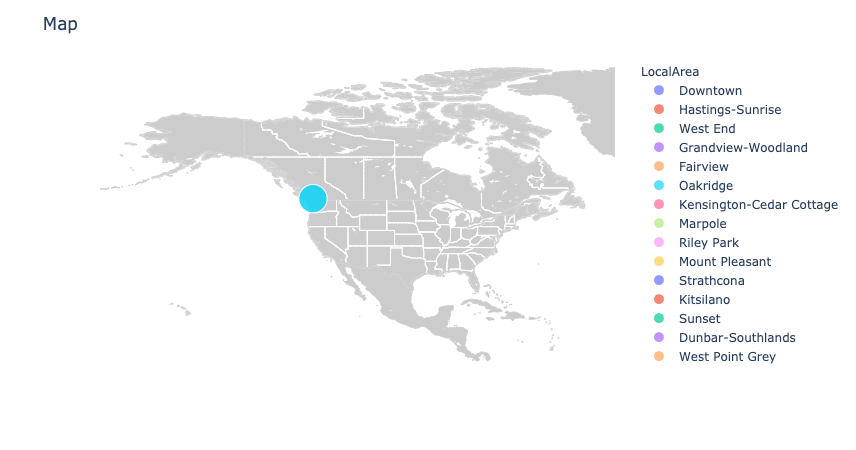

In [143]:
import plotly.express as px
fig = px.scatter_geo(df_coordinates, lat = "latitude", lon = "longitude", scope="north america",
                    #lataxis = [40,70],
                    #lonaxis = [-130,-55],
                     color="LocalArea", # which column to use to set the color of markers
                     hover_name="BusinessName", # column added to hover information
                     size="NumberofEmployees", # size of markers
                     projection="natural earth")

#fig.update_geos(fitbounds="locations")


fig.update_layout(
    title_text = 'Map',
    geo = dict(
        resolution = 50,
        showland = True,
        showlakes = True,
        landcolor = 'rgb(204, 204, 204)',
        countrycolor = 'rgb(204, 204, 204)',
        lakecolor = 'rgb(255, 255, 255)',
        projection_type = "equirectangular",
        coastlinewidth = 2,
        #lataxis = dict(
        #    range = [48,50],
            #showgrid = True,
            #dtick = 10
        #),
        #lonaxis = dict(
        #    range = [-122,-124],
            #showgrid = True,
            #dtick = 20
        #),
    )
)

fig.show()

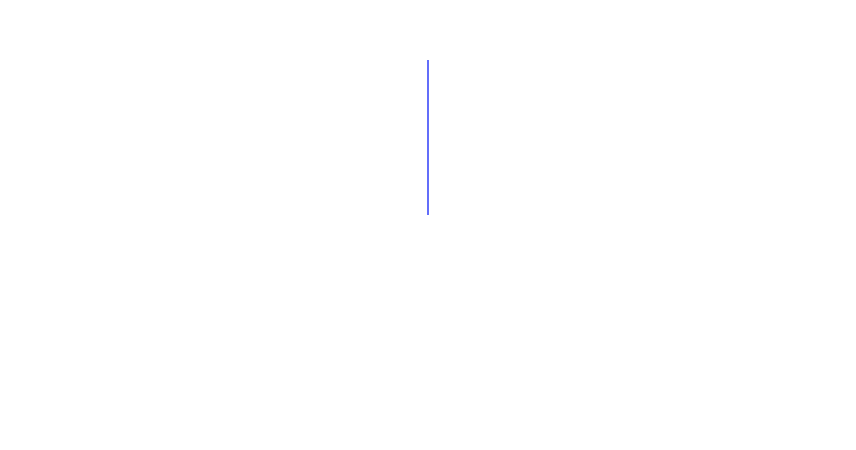

In [142]:
fig = px.line_geo(lat=df_coordinates["latitude"], lon=df_coordinates["longitude"])
fig.update_geos(fitbounds="locations")
fig.show()